In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [3]:
data = pd.read_csv('us_gov_oth_gov.csv')               ## Only US Government vs Others Government
#data = pd.read_csv('us_gov_oth_bus.csv')              ## Only US Government vs Others Business
#data = pd.read_csv('us_bus_oth_gov.csv')              ## Only US Business vs Others Government
#data = pd.read_csv('us_bus_oth_bus.csv')              ## Only US Business vs Others Business
#data = pd.read_csv('overall_data.csv')                ## All government and business data

In [4]:
df = pd.DataFrame(data)
df

,Date,TargetCountry,TargetCountryCode,ReceivingCountry,ReceivingCountryCode,Action,NumArticles,AvgTone,AvgGoldsteinScale
0,20110730,USA,GOV,MEX,GOV,15,6,-14.634146,0.0
1,20120613,USA,GOV,CHN,GOV,40,10,0.483871,1.0
2,20140219,USA,GOV,ISR,GOV,12,5,-3.767123,-0.4
3,20140221,USA,GOV,CHN,GOV,43,6,1.661130,2.8
4,20140222,USA,GOV,JPN,GOV,40,6,-5.590062,1.0
...,...,...,...,...,...,...,...,...,...
133478,20240528,USA,GOV,ISR,GOV,46,8,-0.584795,7.0
133479,20240528,USA,GOV,ESP,GOV,180,2,-0.196078,-9.0
133480,20240528,USA,GOV,GBR,GOV,46,10,1.562500,7.0
133481,20240528,USA,GOV,EGY,GOV,70,1,-6.031128,7.0


In [5]:
#df['Date'].dtype
df['Date'] = pd.to_datetime(data['Date'], format='%Y%m%d')
df['Date'].dtype

dtype('<M8[ns]')

In [6]:
df['YearMonth'] = df['Date'].dt.to_period('M')

In [7]:
df

,Date,TargetCountry,TargetCountryCode,ReceivingCountry,ReceivingCountryCode,Action,NumArticles,AvgTone,AvgGoldsteinScale,YearMonth
0,2011-07-30,USA,GOV,MEX,GOV,15,6,-14.634146,0.0,2011-07
1,2012-06-13,USA,GOV,CHN,GOV,40,10,0.483871,1.0,2012-06
2,2014-02-19,USA,GOV,ISR,GOV,12,5,-3.767123,-0.4,2014-02
3,2014-02-21,USA,GOV,CHN,GOV,43,6,1.661130,2.8,2014-02
4,2014-02-22,USA,GOV,JPN,GOV,40,6,-5.590062,1.0,2014-02
...,...,...,...,...,...,...,...,...,...,...
133478,2024-05-28,USA,GOV,ISR,GOV,46,8,-0.584795,7.0,2024-05
133479,2024-05-28,USA,GOV,ESP,GOV,180,2,-0.196078,-9.0,2024-05
133480,2024-05-28,USA,GOV,GBR,GOV,46,10,1.562500,7.0,2024-05
133481,2024-05-28,USA,GOV,EGY,GOV,70,1,-6.031128,7.0,2024-05


In [8]:
def weighted_avg(df, values, weights):
    return (df[values] * df[weights]).sum() / df[weights].sum()

# Static Top Countries and Actions

In [9]:
country_monthly = df.groupby(['YearMonth', 'ReceivingCountry']).agg(
    TotalArticleCount=('NumArticles', 'sum'),
    TotalActionCount=('Action', 'count'),
    AvgSentiment=('AvgTone', 'mean'),
    Wei_AvgTone=('AvgTone', lambda x: weighted_avg(df.loc[x.index], 'AvgTone', 'NumArticles'))
).reset_index()

In [10]:
country_monthly

,YearMonth,ReceivingCountry,TotalArticleCount,TotalActionCount,AvgSentiment,Wei_AvgTone
0,2011-07,MEX,6,1,-14.634146,-14.634146
1,2012-06,CHN,10,1,0.483871,0.483871
2,2014-02,CAN,10,1,-3.805774,-3.805774
3,2014-02,CHN,20,4,0.041530,0.944865
4,2014-02,IND,5,1,1.156069,1.156069
...,...,...,...,...,...,...
4985,2024-05,SWE,17,2,-0.792056,0.011141
4986,2024-05,THA,4,1,0.321543,0.321543
4987,2024-05,TUR,89,18,-0.493784,-0.265072
4988,2024-05,TWN,44,9,-1.149100,-0.733174


In [11]:
#country_monthly.to_csv('monthly.csv')

In [12]:
action_monthly = df.groupby(['YearMonth', 'Action']).agg(
    TotalActionCount=('Action', 'count'),
    AvgSentiment=('AvgTone', 'mean'),
    Wei_AvgTone=('AvgTone', lambda x: weighted_avg(df.loc[x.index], 'AvgTone', 'NumArticles'))
).reset_index()

In [13]:
action_monthly

,YearMonth,Action,TotalActionCount,AvgSentiment,Wei_AvgTone
0,2011-07,15,1,-14.634146,-14.634146
1,2012-06,40,1,0.483871,0.483871
2,2014-02,12,2,-3.786449,-3.792891
3,2014-02,20,1,1.490066,1.490066
4,2014-02,30,1,-1.492537,-1.492537
...,...,...,...,...,...
8585,2024-05,841,3,0.993035,1.184103
8586,2024-05,1014,2,-8.423017,-8.445161
8587,2024-05,1124,1,-1.812692,-1.812692
8588,2024-05,1312,1,-0.574713,-0.574713


In [14]:
top_countries = country_monthly.groupby('ReceivingCountry')['TotalActionCount'].sum().nlargest(10).index
print('Top 10 Countries:',top_countries.tolist())

Top 10 Countries: ['ISR', 'CHN', 'GBR', 'MEX', 'DEU', 'FRA', 'CAN', 'IND', 'JPN', 'SAU']


In [15]:
top_actions = action_monthly.groupby('Action')['TotalActionCount'].sum().nlargest(5).index
print('Top 5 Actions:', top_actions.tolist())

Top 5 Actions: [40, 46, 36, 10, 43]


In [16]:
#df.set_index('Date', inplace=True)
df

,Date,TargetCountry,TargetCountryCode,ReceivingCountry,ReceivingCountryCode,Action,NumArticles,AvgTone,AvgGoldsteinScale,YearMonth
0,2011-07-30,USA,GOV,MEX,GOV,15,6,-14.634146,0.0,2011-07
1,2012-06-13,USA,GOV,CHN,GOV,40,10,0.483871,1.0,2012-06
2,2014-02-19,USA,GOV,ISR,GOV,12,5,-3.767123,-0.4,2014-02
3,2014-02-21,USA,GOV,CHN,GOV,43,6,1.661130,2.8,2014-02
4,2014-02-22,USA,GOV,JPN,GOV,40,6,-5.590062,1.0,2014-02
...,...,...,...,...,...,...,...,...,...,...
133478,2024-05-28,USA,GOV,ISR,GOV,46,8,-0.584795,7.0,2024-05
133479,2024-05-28,USA,GOV,ESP,GOV,180,2,-0.196078,-9.0,2024-05
133480,2024-05-28,USA,GOV,GBR,GOV,46,10,1.562500,7.0,2024-05
133481,2024-05-28,USA,GOV,EGY,GOV,70,1,-6.031128,7.0,2024-05


In [17]:
country_monthly_top = country_monthly[country_monthly['ReceivingCountry'].isin(top_countries)]
country_monthly_top

,YearMonth,ReceivingCountry,TotalArticleCount,TotalActionCount,AvgSentiment,Wei_AvgTone
0,2011-07,MEX,6,1,-14.634146,-14.634146
1,2012-06,CHN,10,1,0.483871,0.483871
2,2014-02,CAN,10,1,-3.805774,-3.805774
3,2014-02,CHN,20,4,0.041530,0.944865
4,2014-02,IND,5,1,1.156069,1.156069
...,...,...,...,...,...,...
4971,2024-05,IND,123,20,-1.058010,-0.899189
4973,2024-05,ISR,2318,242,-3.605541,-3.695109
4975,2024-05,JPN,251,37,-1.024678,-0.937511
4977,2024-05,MEX,167,24,-2.672083,-3.745710


In [18]:
country_monthly_top[country_monthly_top['ReceivingCountry']=='SAU']

,YearMonth,ReceivingCountry,TotalArticleCount,TotalActionCount,AvgSentiment,Wei_AvgTone
33,2014-05,SAU,5,1,-2.055800,-2.055800
50,2014-07,SAU,6,2,-2.454404,-2.099518
65,2014-09,SAU,14,2,3.263068,3.046448
103,2015-01,SAU,32,4,-4.430983,-4.200529
135,2015-02,SAU,94,19,-1.525372,-2.185524
...,...,...,...,...,...,...
4818,2024-01,SAU,121,14,-3.099694,-2.220023
4859,2024-02,SAU,261,47,-2.681412,-2.035130
4903,2024-03,SAU,98,13,-3.476930,-3.334865
4944,2024-04,SAU,101,15,-1.677491,-1.610389


In [19]:
action_monthly_top = action_monthly[action_monthly['Action'].isin(top_actions)]
action_monthly_top

,YearMonth,Action,TotalActionCount,AvgSentiment,Wei_AvgTone
1,2012-06,40,1,0.483871,0.483871
5,2014-02,40,2,-2.216996,-2.523639
6,2014-02,43,1,1.661130,1.661130
7,2014-02,46,1,-3.130755,-3.130755
10,2014-03,10,2,-0.135348,-0.316119
...,...,...,...,...,...
8519,2024-05,10,62,-2.395755,-2.800495
8537,2024-05,36,37,-1.168948,-1.556594
8538,2024-05,40,118,-1.391022,-2.531202
8541,2024-05,43,49,-0.415671,-0.917408


In [20]:
action_monthly_top[action_monthly_top['Action']==40]

,YearMonth,Action,TotalActionCount,AvgSentiment,Wei_AvgTone
1,2012-06,40,1,0.483871,0.483871
5,2014-02,40,2,-2.216996,-2.523639
16,2014-03,40,2,2.090068,4.855843
32,2014-05,40,1,-2.055800,-2.055800
39,2014-06,40,1,-0.178253,-0.178253
...,...,...,...,...,...
8245,2024-01,40,156,-1.606351,-1.613059
8313,2024-02,40,143,-1.417373,-1.791654
8389,2024-03,40,171,-0.340575,-1.066168
8459,2024-04,40,171,-1.283587,-1.890338


## Top 10 Country - Monthly Time Series

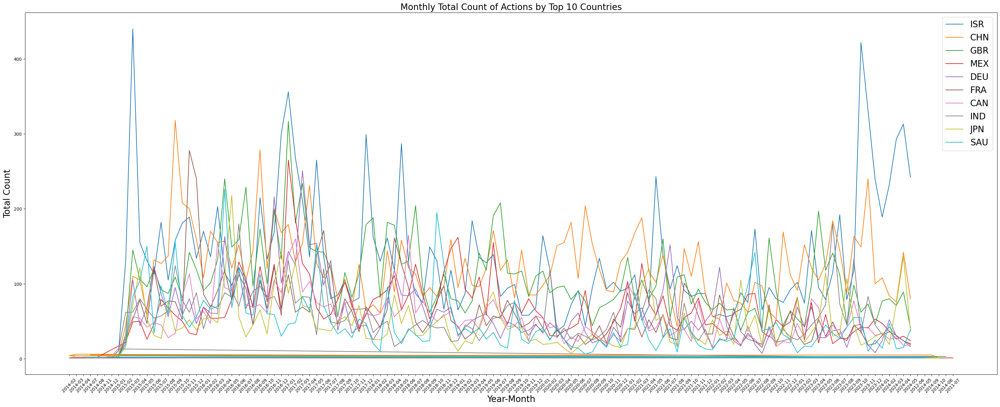

In [21]:
fig, ax = plt.subplots(figsize=(40, 15))

# Country Action
for country in top_countries:
    subset = country_monthly_top[country_monthly_top['ReceivingCountry'] == country]
    ax.plot(subset['YearMonth'].astype(str), subset['TotalActionCount'], label= f'{country}')

ax.set_title('Monthly Total Count of Actions by Top 10 Countries',fontsize=20)
plt.xlabel('Year-Month',fontsize=20)
ax.set_ylabel('Total Count',fontsize=20)
ax.legend(fontsize=20)
plt.xticks(rotation=45)
plt.show()

# This plot shows the monthly count of actions taken by top 10 country government towards US.

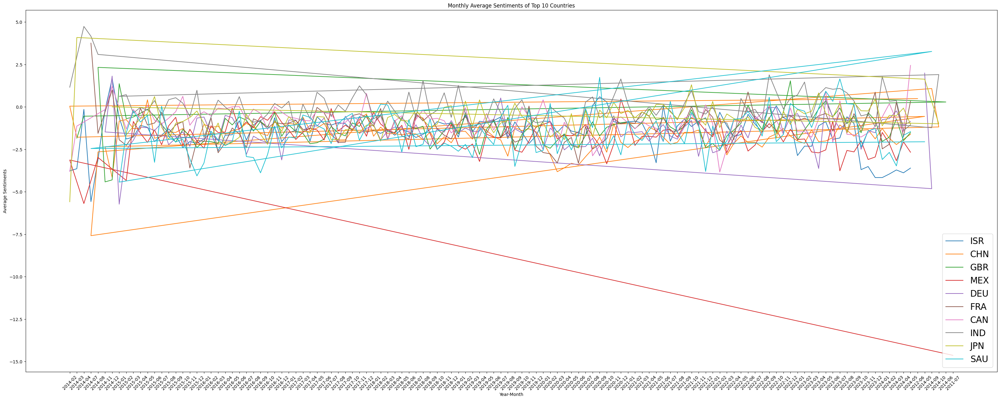

In [22]:
fig, ax = plt.subplots(figsize=(40, 15))

# Country Average Sentiment
for country in top_countries:
    subset = country_monthly_top[country_monthly_top['ReceivingCountry'] == country]
    ax.plot(subset['YearMonth'].astype(str), subset['AvgSentiment'], label=f'{country}')

ax.set_title('Monthly Average Sentiments of Top 10 Countries')
ax.set_ylabel('Average Sentiments')
plt.xlabel('Year-Month')
ax.legend(fontsize=20, loc='lower right')
plt.xticks(rotation=45)
plt.show()

# This plot shows the monthly average sentiment of actions taken by top 10 country government towards US.

## Top 5 Action - Monthly Time Series

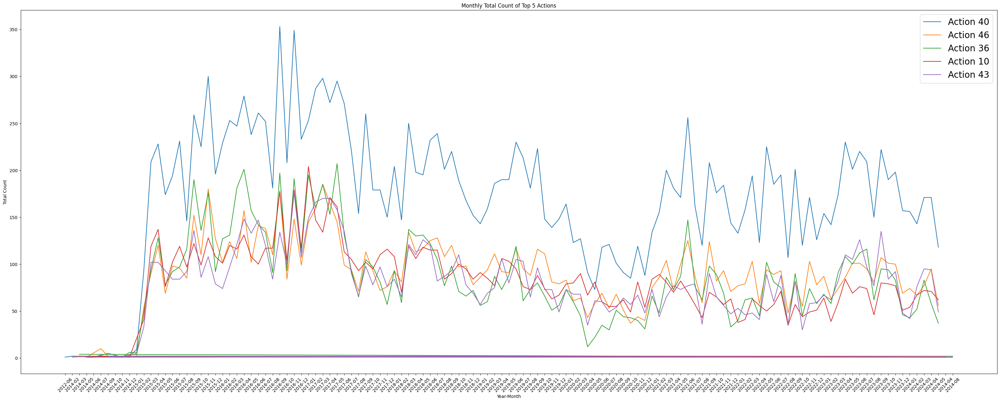

In [23]:
fig, ax = plt.subplots(figsize=(40, 15))

# Action Count
for action in top_actions:
    subset = action_monthly_top[action_monthly_top['Action'] == action]
    ax.plot(subset['YearMonth'].astype(str), subset['TotalActionCount'], label=f'Action {action}')

ax.set_title('Monthly Total Count of Top 5 Actions')
ax.set_ylabel('Total Count')
ax.legend(fontsize=20)
plt.xlabel('Year-Month')
plt.xticks(rotation=45)
plt.show()


# The plot shows the monthly count of top actions towards US goverment by other governments

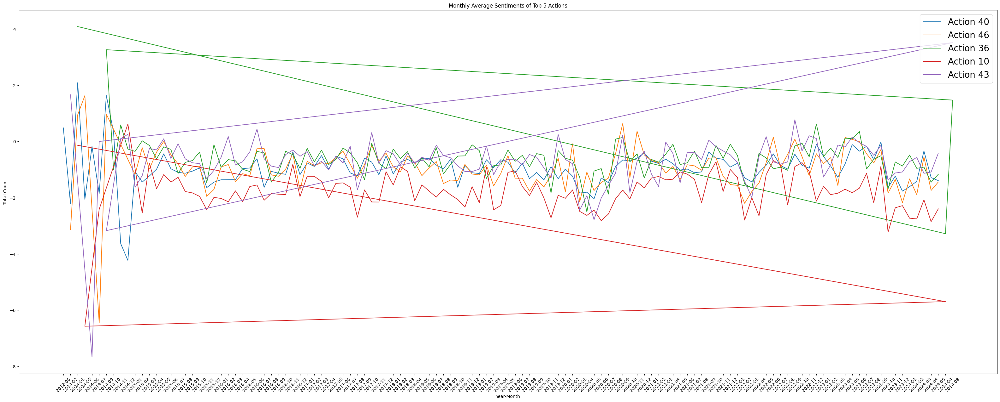

In [24]:
fig, ax = plt.subplots(figsize=(40, 15))

# Action Sentiment
for action in top_actions:
    subset = action_monthly_top[action_monthly_top['Action'] == action]
    ax.plot(subset['YearMonth'].astype(str), subset['AvgSentiment'], label=f'Action {action}')

ax.set_title('Monthly Average Sentiments of Top 5 Actions')
ax.set_ylabel('Total Count')
ax.legend(fontsize=20, loc = 'upper right')
plt.xlabel('Year-Month')
plt.xticks(rotation=45)
plt.show()


# The plot shows the monthly average sentiment of top actions towards US goverment by other governments

# Dynamic Top Countries and Actions

In [25]:
top_country_actiontrends = pd.DataFrame()
top_country_sentitrends = pd.DataFrame()
top_action_actiontrends = pd.DataFrame()
top_action_sentitrends = pd.DataFrame()

In [26]:
for period in data['YearMonth'].unique():
    # Action count of top 10 countries for the current month
    top_countries = country_monthly[country_monthly['YearMonth'] == period].nlargest(10, 'TotalActionCount')
    top_countries['YearMonth'] = period
    top_country_actiontrends = pd.concat([top_country_actiontrends, top_countries])
    
    # Average sentiment of top 10 countries for the current month
    top_senticountries = country_monthly[country_monthly['YearMonth'] == period].nlargest(10, 'AvgSentiment')
    top_senticountries['YearMonth'] = period
    top_country_sentitrends = pd.concat([top_country_sentitrends, top_senticountries])
    
    # Get the top actions for the current month
    top_actions = action_monthly[action_monthly['YearMonth'] == period].nlargest(5, 'TotalActionCount')
    top_actions['YearMonth'] = period
    top_action_actiontrends = pd.concat([top_action_actiontrends, top_actions])
    
    # Get the top actions for the current month
    top_sentiactions = action_monthly[action_monthly['YearMonth'] == period].nlargest(5, 'TotalActionCount')
    top_sentiactions['YearMonth'] = period
    top_action_sentitrends = pd.concat([top_action_sentitrends, top_sentiactions])    

In [93]:
top_country_actiontrends[top_country_actiontrends['YearMonth']=='2024-05']

,YearMonth,ReceivingCountry,TotalArticleCount,TotalActionCount,AvgSentiment,Wei_AvgTone
4973,2024-05,ISR,2318,242,-3.605541,-3.695109
4958,2024-05,CHN,661,80,-1.610183,-1.250850
4966,2024-05,GBR,268,41,-1.517560,-1.648209
4983,2024-05,SAU,285,39,-1.456575,-1.871262
4962,2024-05,EGY,297,37,-2.857270,-2.709020
4975,2024-05,JPN,251,37,-1.024678,-0.937511
4977,2024-05,MEX,167,24,-2.672083,-3.745710
4971,2024-05,IND,123,20,-1.058010,-0.899189
4965,2024-05,FRA,107,19,0.334153,-0.956978
4955,2024-05,CAN,93,18,2.444553,2.407216


### Monthly Total Count of Actions by Dynamic Top 10 Countries

In [53]:
#top_country_actiontrends[top_country_actiontrends['YearMonth']=='2024-05']
country_actionpivot = top_country_actiontrends.pivot_table(index='YearMonth', columns='ReceivingCountry', values='TotalActionCount', fill_value=0)
country_actionpivot

ReceivingCountry,ARE,AUS,BEL,BRA,CAN,CHE,CHL,CHN,COL,DEU,...,PHL,POL,QAT,SAU,SGP,SWE,THA,TUR,TWN,ZAF
YearMonth,,,,,,,,,,,,,,,,,,,,,
2011-07,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-06,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2014-02,0,0,0,0,1,0,0,4,0,0,...,0,0,0,0,0,0,1,0,0,0
2014-03,0,0,0,0,2,0,0,6,1,0,...,0,0,0,0,0,0,0,0,0,0
2014-04,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01,0,0,0,0,34,0,0,108,0,24,...,0,0,0,0,0,0,0,0,24,0
2024-02,0,0,0,0,26,0,0,84,0,52,...,0,0,0,47,0,0,0,0,0,0
2024-03,0,0,0,0,0,0,0,76,0,30,...,0,0,0,0,0,0,0,0,0,0


In [54]:
# Replace 0 values with NaN
country_actionpivot.replace(0, np.nan, inplace=True)

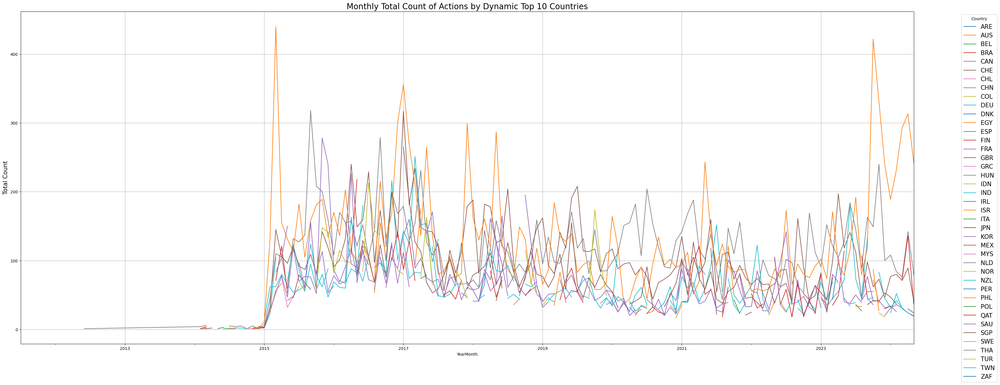

In [69]:
fig, ax = plt.subplots(figsize=(40, 15))
country_actionpivot.plot(ax=ax)
ax.set_title('Monthly Total Count of Actions by Dynamic Top 10 Countries',fontsize = 20)
ax.set_ylabel('Total Count',fontsize = 15)
ax.legend(title='Country', fontsize = 15, bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True)

# This plot shows the monthly count of actions taken by dynamic top 10 country government towards US.

### Monthly Average Sentiments by Dynamic Top 10 Countries

In [58]:
country_sentipivot = top_country_sentitrends.pivot_table(index='YearMonth', columns='ReceivingCountry', values='AvgSentiment', fill_value=0)
country_sentipivot

ReceivingCountry,ARE,AUS,AUT,BEL,BRA,CAN,CHE,CHL,CHN,COL,...,POL,PRT,QAT,SAU,SGP,SWE,THA,TUR,TWN,ZAF
YearMonth,,,,,,,,,,,,,,,,,,,,,
2011-07,0.000000,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2012-06,0.000000,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.483871,0.00000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2014-02,0.000000,0.0,0.000000,0.0,0.00000,-3.805774,0.0,0.000000,0.041530,0.00000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,3.428571,0.000000,0.000000,0.000000
2014-03,0.000000,0.0,0.000000,0.0,0.00000,-1.134625,0.0,0.000000,-1.787058,5.47046,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,-3.039751,0.000000,0.000000
2014-04,0.000000,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01,1.694240,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.00000,...,1.738378,1.449275,0.0,0.0,1.500262,1.410955,0.000000,0.000000,0.000000,0.000000
2024-02,0.000000,0.0,2.299140,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.0,0.0,0.000000,3.586419,0.000000,0.000000,0.000000,2.150538
2024-03,1.690141,0.0,0.908137,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.00000,...,0.000000,1.819356,0.0,0.0,0.000000,1.200043,0.000000,0.000000,0.000000,0.000000


In [61]:
country_sentipivot.replace(0, np.nan, inplace=True)

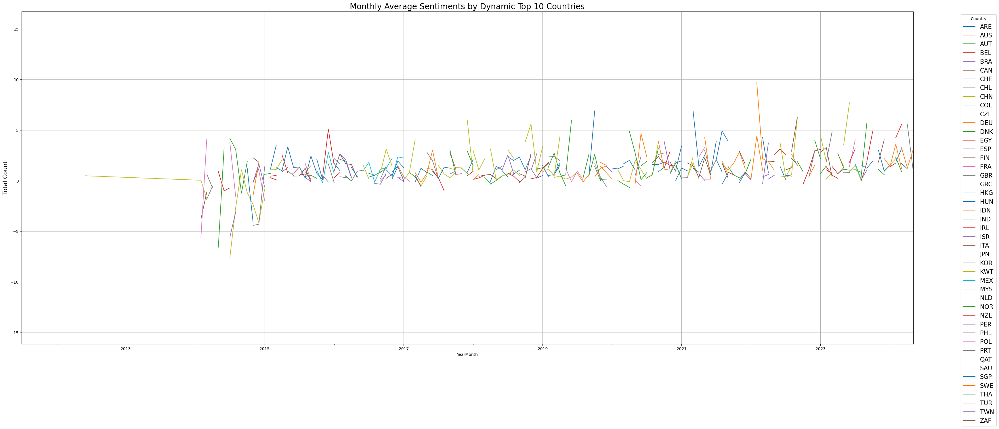

In [70]:
fig, ax = plt.subplots(figsize=(40, 15))
country_sentipivot.plot(ax=ax)
ax.set_title('Monthly Average Sentiments by Dynamic Top 10 Countries',fontsize = 20)
ax.set_ylabel('Total Count',fontsize = 15)
ax.legend(title='Country', fontsize = 15,bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True)

# This plot shows the monthly average sentiments by dynamic top 10 countries government towards US.

### Monthly Total Count of Actions by Dynamic Top 5 Actions

In [63]:
action_pivot = top_action_actiontrends.pivot_table(index='YearMonth', columns='Action', values='TotalActionCount', fill_value=0)
action_pivot

Action,10,12,13,15,20,30,31,33,36,40,...,43,45,46,50,51,54,57,73,84,114
YearMonth,,,,,,,,,,,,,,,,,,,,,
2011-07,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2012-06,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2014-02,0,2,0,0,1,1,0,0,0,2,...,1,0,0,0,0,0,0,0,0,0
2014-03,2,0,0,0,3,2,0,0,4,2,...,0,0,0,0,0,0,0,0,0,0
2014-04,1,0,0,0,1,0,0,1,0,0,...,0,0,0,2,2,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01,54,0,0,0,0,0,0,0,0,156,...,0,0,74,0,70,0,0,0,0,0
2024-02,67,0,0,0,0,0,0,0,0,143,...,76,0,67,0,0,0,0,0,0,0
2024-03,0,0,0,0,0,0,0,0,83,171,...,95,0,77,0,87,0,0,0,0,0


In [64]:
action_pivot.replace(0, np.nan, inplace=True)

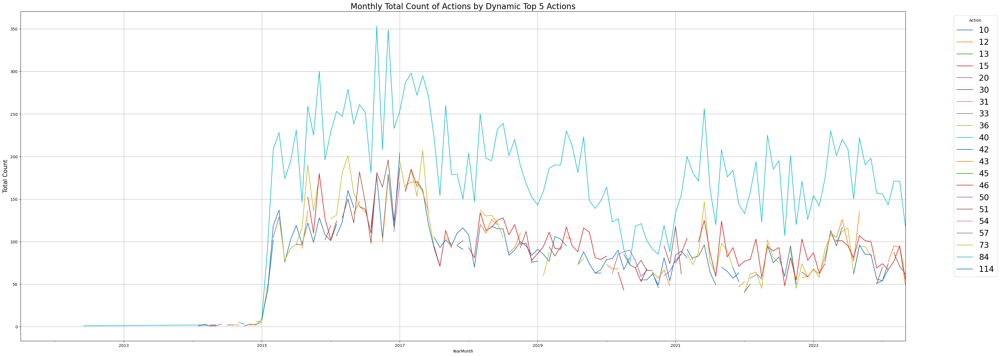

In [73]:
fig, ax = plt.subplots(figsize=(40, 15))
action_pivot.plot(ax=ax)
ax.set_title('Monthly Total Count of Actions by Dynamic Top 5 Actions',fontsize = 20)
ax.set_ylabel('Total Count',fontsize = 15)
ax.legend(title='Action', fontsize = 20, bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True)

# This plot shows the monthly total count of actions by dynamic top 10 countries government towards US.

### Monthly Average Sentiments by Dynamic Top 5 Actions

In [66]:
action_sentipivot = top_action_sentitrends.pivot_table(index='YearMonth', columns='Action', values='AvgSentiment', fill_value=0)
action_sentipivot

Action,10,12,13,15,20,30,31,33,36,40,...,43,45,46,50,51,54,57,73,84,114
YearMonth,,,,,,,,,,,,,,,,,,,,,
2011-07,0.000000,0.000000,0.0,-14.634146,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0,0.0,0.0,0.0,0.0
2012-06,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.483871,...,0.000000,0.0,0.000000,0.000000,0.000000,0,0.0,0.0,0.0,0.0
2014-02,0.000000,-3.786449,0.0,0.000000,1.490066,-1.492537,0.0,0.000000,0.000000,-2.216996,...,1.661130,0.0,0.000000,0.000000,0.000000,0,0.0,0.0,0.0,0.0
2014-03,-0.135348,0.000000,0.0,0.000000,-2.505239,0.476891,0.0,0.000000,4.086003,2.090068,...,0.000000,0.0,0.000000,0.000000,0.000000,0,0.0,0.0,0.0,0.0
2014-04,-5.693950,0.000000,0.0,0.000000,-0.549451,0.000000,0.0,1.818182,0.000000,0.000000,...,0.000000,0.0,0.000000,-0.715435,3.535736,0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01,-2.728803,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-1.606351,...,0.000000,0.0,-1.331713,0.000000,-1.585516,0,0.0,0.0,0.0,0.0
2024-02,-2.751442,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-1.417373,...,-0.567515,0.0,-1.891516,0.000000,0.000000,0,0.0,0.0,0.0,0.0
2024-03,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,-0.912253,-0.340575,...,-1.132432,0.0,-0.554359,0.000000,-0.279615,0,0.0,0.0,0.0,0.0


In [67]:
action_sentipivot.replace(0, np.nan, inplace=True)

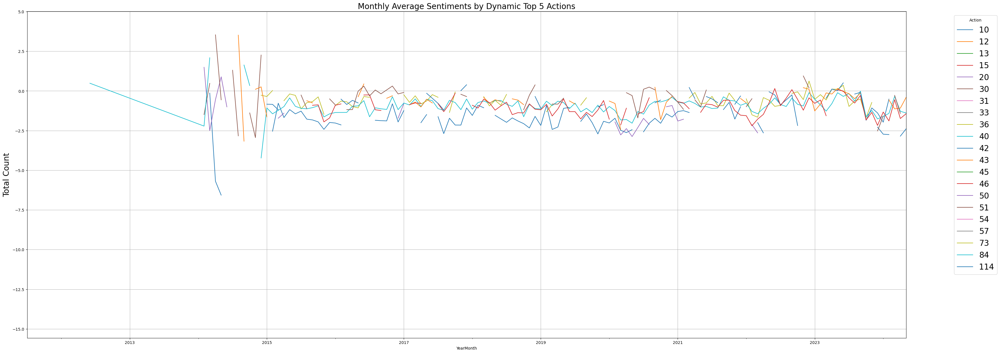

In [68]:
fig, ax = plt.subplots(figsize=(40, 15))
action_sentipivot.plot(ax=ax)
ax.set_title('Monthly Average Sentiments by Dynamic Top 5 Actions',fontsize = 20)
ax.set_ylabel('Total Count',fontsize = 20)
ax.legend(title='Action', fontsize = 20, bbox_to_anchor=(1.05, 1), loc='upper left')
ax.grid(True)

# This plot shows the monthly average sentiments by dynamic top 10 countries government towards US.

## Some Scatter Plots

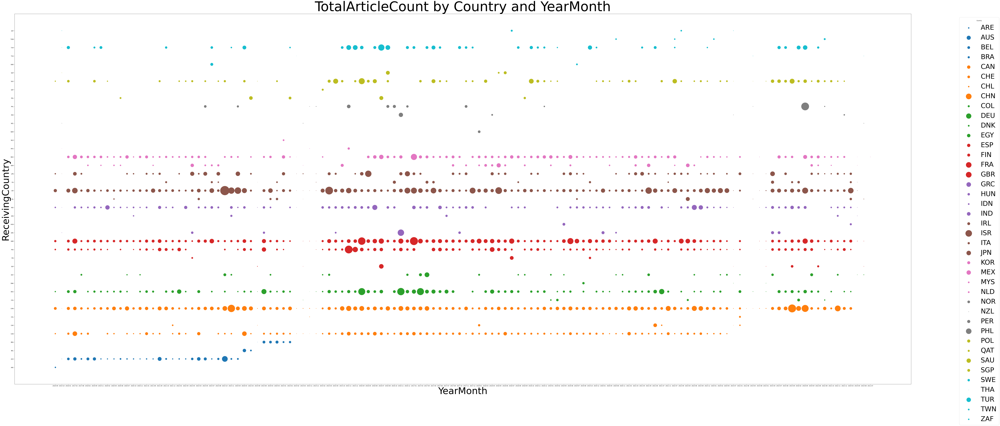

In [120]:
top_country_actiontrends['YearMonth'] = top_country_actiontrends['YearMonth'].astype(str)
grouped = top_country_actiontrends.groupby('ReceivingCountry')
colors = plt.cm.get_cmap('tab10', len(grouped))


plt.figure(figsize=(120, 50))
for idx, (country, country_data) in enumerate(grouped):
    plt.scatter(country_data['YearMonth'], [idx]*len(country_data), s=country_data['TotalArticleCount']*0.5, label=country, color=colors(idx))

plt.yticks(range(len(grouped)), grouped.groups.keys())

plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left',fontsize = 50)
plt.xlabel('YearMonth',fontsize = 70)
plt.ylabel('ReceivingCountry',fontsize = 70)
plt.title('Article Count by Country and YearMonth',fontsize = 100)
plt.show()

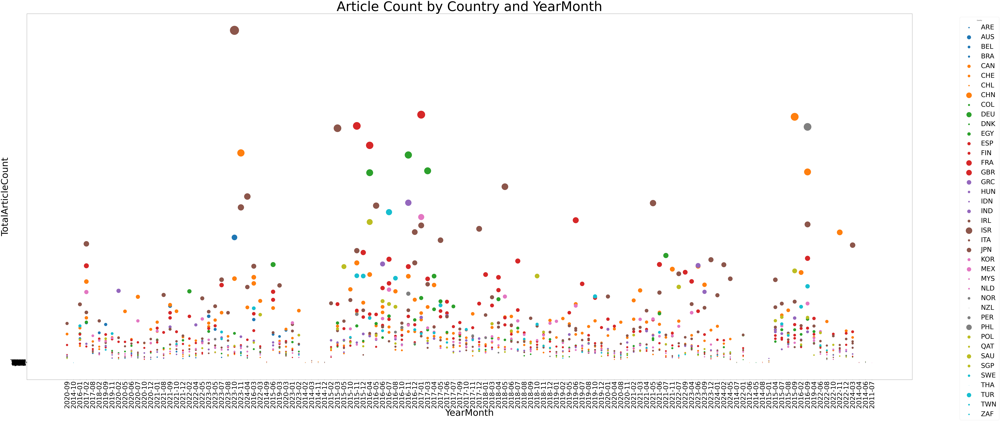

In [135]:
plt.figure(figsize=(120, 50))
for idx, (country, country_data) in enumerate(grouped):
    plt.scatter(country_data['YearMonth'], country_data['TotalArticleCount'], s=country_data['TotalArticleCount']*0.5, label=country, color=colors(idx))

plt.xticks(rotation='vertical', fontsize=50)
plt.yticks(range(len(grouped)), grouped.groups.keys(), fontsize=50)

plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left',fontsize=50)
plt.xlabel('YearMonth', fontsize=70)
plt.ylabel('TotalArticleCount', fontsize=70)
plt.title('Article Count by Country and YearMonth', fontsize=100)
plt.show()


In [134]:
plt.figure(figsize=(120, 100))
for idx, (country, country_data) in enumerate(grouped):
    plt.scatter(country_data['TotalArticleCount'], country_data['YearMonth'], s=country_data['TotalArticleCount']*0.5, label=country, color=colors(idx))

#plt.yticks(rotation='horizontal', fontsize=50)
plt.xticks(range(10), fontsize=50)
plt.xticks(range(len(grouped)), grouped.groups.keys(), fontsize=50)

plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left',fontsize=50)
plt.ylabel('YearMonth', fontsize=70)
plt.xlabel('TotalArticleCount', fontsize=70)
plt.title('Article Count by Country and YearMonth', fontsize=100)
plt.grid(True,axis='x')
plt.show()
